In [7]:
__author__ = "cp"

#conda install -c https://conda.binstar.org/menpo opencv
#conda install shapely
#pip install tifffile
#mkdir data, subm, msk
#scp -i aws_eu.pem unet_42quality.hdf5  ubuntu@ec2-34-248-60-241.eu-west-1.compute.amazonaws.com:~/fish/

import matplotlib.pyplot as plt
import numpy as np
import cv2
import pandas as pd
from shapely.wkt import loads as wkt_loads
import tifffile as tiff
import os
import random
from keras.models import Model, load_model
from keras.layers import Input, merge, Convolution2D, MaxPooling2D, UpSampling2D, Reshape, core, Dropout
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras import backend as K
from sklearn.metrics import jaccard_similarity_score
from shapely.geometry import MultiPolygon, Polygon
import shapely.wkt
import shapely.affinity
from collections import defaultdict

Using Theano backend.
Using gpu device 0: Tesla K80 (CNMeM is disabled, cuDNN 5103)
/home/ubuntu/anaconda2/lib/python2.7/site-packages/theano/sandbox/cuda/__init__.py:600: UserWarning: Your cuDNN version is more recent than the one Theano officially supports. If you see any problems, try updating Theano or downgrading cuDNN to version 5.
  warnings.warn(warn)


In [8]:
N_Cls = 10
DF = pd.read_csv('train_wkt_v4.csv')
GS = pd.read_csv('grid_sizes.csv', names=['ImageId', 'Xmax', 'Ymin'], skiprows=1)
SB = pd.read_csv('sample_submission.csv')
ISZ = 160
smooth = 1e-12

In [9]:
def _convert_coordinates_to_raster(coords, img_size, xymax):
    # __author__ = visoft
    # https://www.kaggle.com/visoft/dstl-satellite-imagery-feature-detection/export-pixel-wise-mask
    Xmax, Ymax = xymax
    H, W = img_size
    W1 = 1.0 * W * W / (W + 1)
    H1 = 1.0 * H * H / (H + 1)
    xf = W1 / Xmax
    yf = H1 / Ymax
    coords[:, 1] *= yf
    coords[:, 0] *= xf
    coords_int = np.round(coords).astype(np.int32)
    return coords_int


In [10]:
def _get_xmax_ymin(grid_sizes_panda, imageId):
    # __author__ = visoft
    # https://www.kaggle.com/visoft/dstl-satellite-imagery-feature-detection/export-pixel-wise-mask
    xmax, ymin = grid_sizes_panda[grid_sizes_panda.ImageId == imageId].iloc[0, 1:].astype(float)
    return (xmax, ymin)


In [11]:
def _get_polygon_list(wkt_list_pandas, imageId, cType):
    # __author__ = visoft
    # https://www.kaggle.com/visoft/dstl-satellite-imagery-feature-detection/export-pixel-wise-mask
    df_image = wkt_list_pandas[wkt_list_pandas.ImageId == imageId]
    multipoly_def = df_image[df_image.ClassType == cType].MultipolygonWKT
    polygonList = None
    if len(multipoly_def) > 0:
        assert len(multipoly_def) == 1
        polygonList = wkt_loads(multipoly_def.values[0])
    return polygonList


In [12]:
def _get_and_convert_contours(polygonList, raster_img_size, xymax):
    # __author__ = visoft
    # https://www.kaggle.com/visoft/dstl-satellite-imagery-feature-detection/export-pixel-wise-mask
    perim_list = []
    interior_list = []
    if polygonList is None:
        return None
    for k in range(len(polygonList)):
        poly = polygonList[k]
        perim = np.array(list(poly.exterior.coords))
        perim_c = _convert_coordinates_to_raster(perim, raster_img_size, xymax)
        perim_list.append(perim_c)
        for pi in poly.interiors:
            interior = np.array(list(pi.coords))
            interior_c = _convert_coordinates_to_raster(interior, raster_img_size, xymax)
            interior_list.append(interior_c)
    return perim_list, interior_list

In [13]:
def _plot_mask_from_contours(raster_img_size, contours, class_value=1):
    # __author__ = visoft
    # https://www.kaggle.com/visoft/dstl-satellite-imagery-feature-detection/export-pixel-wise-mask
    img_mask = np.zeros(raster_img_size, np.uint8)
    if contours is None:
        return img_mask
    perim_list, interior_list = contours
    cv2.fillPoly(img_mask, perim_list, class_value)
    cv2.fillPoly(img_mask, interior_list, 0)
    return img_mask

In [14]:
def generate_mask_for_image_and_class(raster_size, imageId, class_type, grid_sizes_panda=GS, wkt_list_pandas=DF):
    # __author__ = visoft
    # https://www.kaggle.com/visoft/dstl-satellite-imagery-feature-detection/export-pixel-wise-mask
    xymax = _get_xmax_ymin(grid_sizes_panda, imageId)
    polygon_list = _get_polygon_list(wkt_list_pandas, imageId, class_type)
    contours = _get_and_convert_contours(polygon_list, raster_size, xymax)
    mask = _plot_mask_from_contours(raster_size, contours, 1)
    return mask

In [15]:
def M(image_id):
    # __author__ = amaia
    # https://www.kaggle.com/aamaia/dstl-satellite-imagery-feature-detection/rgb-using-m-bands-example
    img = tiff.imread('sixteen_band/{}_M.tif'.format(image_id))
    img = np.rollaxis(img, 0, 3)
    return img

In [16]:
def stretch_n(bands, lower_percent=5, higher_percent=95):
    #Bug Fix
    out = np.zeros_like(bands).astype(np.float32)
    n = bands.shape[2]
    for i in range(n):
        a = 0  # np.min(band)
        b = 1  # np.max(band)
        c = np.percentile(bands[:, :, i], lower_percent)
        d = np.percentile(bands[:, :, i], higher_percent)
        t = a + (bands[:, :, i] - c) * (b - a) / (d - c)
        t[t < a] = a
        t[t > b] = b
        out[:, :, i] = t

    return out.astype(np.float32)


In [17]:
def jaccard_coef(y_true, y_pred):
    # __author__ = Vladimir Iglovikov
    intersection = K.sum(y_true * y_pred, axis=[0, -1, -2])
    sum_ = K.sum(y_true + y_pred, axis=[0, -1, -2])

    jac = (intersection + smooth) / (sum_ - intersection + smooth)

    return K.mean(jac)

In [18]:
def jaccard_coef_int(y_true, y_pred):
    # __author__ = Vladimir Iglovikov
    y_pred_pos = K.round(K.clip(y_pred, 0, 1))

    intersection = K.sum(y_true * y_pred_pos, axis=[0, -1, -2])
    sum_ = K.sum(y_true + y_pred_pos, axis=[0, -1, -2])
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return K.mean(jac)

In [19]:

def stick_all_train():
    print("let's stick all imgs together")
    s = 835

    x = np.zeros((5 * s, 5 * s, 8))
    y = np.zeros((5 * s, 5 * s, N_Cls))

    ids = sorted(DF.ImageId.unique())
    print(len(ids))
    for i in range(5):
        for j in range(5):
            id = ids[5 * i + j]

            img = M(id)
            img = stretch_n(img)
            print(img.shape, id, np.amax(img), np.amin(img))
            x[s * i:s * i + s, s * j:s * j + s, :] = img[:s, :s, :]
            for z in range(N_Cls):
                y[s * i:s * i + s, s * j:s * j + s, z] = generate_mask_for_image_and_class(
                    (img.shape[0], img.shape[1]), id, z + 1)[:s, :s]

    print(np.amax(y), np.amin(y))

    np.save('data/x_trn_%d' % N_Cls, x)
    np.save('data/y_trn_%d' % N_Cls, y)


In [20]:
def get_patches(img, msk, amt=10000, aug=True):
    is2 = int(1.0 * ISZ)
    xm, ym = img.shape[0] - is2, img.shape[1] - is2

    x, y = [], []

    tr = [0.4, 0.1, 0.1, 0.15, 0.3, 0.95, 0.1, 0.05, 0.001, 0.005]
    for i in range(amt):
        xc = random.randint(0, xm)
        yc = random.randint(0, ym)

        im = img[xc:xc + is2, yc:yc + is2]
        ms = msk[xc:xc + is2, yc:yc + is2]

        for j in range(N_Cls):
            sm = np.sum(ms[:, :, j])
            if 1.0 * sm / is2 ** 2 > tr[j]:
                if aug:
                    if random.uniform(0, 1) > 0.5:
                        im = im[::-1]
                        ms = ms[::-1]
                    if random.uniform(0, 1) > 0.5:
                        im = im[:, ::-1]
                        ms = ms[:, ::-1]

                x.append(im)
                y.append(ms)

    x, y = 2 * np.transpose(x, (0, 3, 1, 2)) - 1, np.transpose(y, (0, 3, 1, 2))
    print(x.shape, y.shape, np.amax(x), np.amin(x), np.amax(y), np.amin(y))
    return x, y


In [21]:
def make_val():
    print("let's pick some samples for validation")
    img = np.load('data/x_trn_%d.npy' % N_Cls)
    msk = np.load('data/y_trn_%d.npy' % N_Cls)
    x, y = get_patches(img, msk, amt=3000)

    np.save('data/x_tmp_%d' % N_Cls, x)
    np.save('data/y_tmp_%d' % N_Cls, y)


In [22]:
def get_unet():
    inputs = Input((8, ISZ, ISZ))
    conv1 = Convolution2D(32, 3, 3, activation='relu', border_mode='same')(inputs)
    conv1 = Convolution2D(32, 3, 3, activation='relu', border_mode='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Convolution2D(64, 3, 3, activation='relu', border_mode='same')(pool1)
    conv2 = Convolution2D(64, 3, 3, activation='relu', border_mode='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Convolution2D(128, 3, 3, activation='relu', border_mode='same')(pool2)
    conv3 = Convolution2D(128, 3, 3, activation='relu', border_mode='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Convolution2D(256, 3, 3, activation='relu', border_mode='same')(pool3)
    conv4 = Convolution2D(256, 3, 3, activation='relu', border_mode='same')(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    conv5 = Convolution2D(512, 3, 3, activation='relu', border_mode='same')(pool4)
    conv5 = Convolution2D(512, 3, 3, activation='relu', border_mode='same')(conv5)

    up6 = merge([UpSampling2D(size=(2, 2))(conv5), conv4], mode='concat', concat_axis=1)
    conv6 = Convolution2D(256, 3, 3, activation='relu', border_mode='same')(up6)
    conv6 = Convolution2D(256, 3, 3, activation='relu', border_mode='same')(conv6)

    up7 = merge([UpSampling2D(size=(2, 2))(conv6), conv3], mode='concat', concat_axis=1)
    conv7 = Convolution2D(128, 3, 3, activation='relu', border_mode='same')(up7)
    conv7 = Convolution2D(128, 3, 3, activation='relu', border_mode='same')(conv7)

    up8 = merge([UpSampling2D(size=(2, 2))(conv7), conv2], mode='concat', concat_axis=1)
    conv8 = Convolution2D(64, 3, 3, activation='relu', border_mode='same')(up8)
    conv8 = Convolution2D(64, 3, 3, activation='relu', border_mode='same')(conv8)

    up9 = merge([UpSampling2D(size=(2, 2))(conv8), conv1], mode='concat', concat_axis=1)
    conv9 = Convolution2D(32, 3, 3, activation='relu', border_mode='same')(up9)
    conv9 = Convolution2D(32, 3, 3, activation='relu', border_mode='same')(conv9)

    conv10 = Convolution2D(N_Cls, 1, 1, activation='sigmoid')(conv9)

    model = Model(input=inputs, output=conv10)
    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=[jaccard_coef, jaccard_coef_int, 'accuracy'])
    return model


In [23]:
def calc_jacc(model):
    img = np.load('data/x_tmp_%d.npy' % N_Cls)
    msk = np.load('data/y_tmp_%d.npy' % N_Cls)

    prd = model.predict(img, batch_size=4)
    print(prd.shape, msk.shape)
    avg, trs = [], []

    for i in range(N_Cls):
        t_msk = msk[:, i, :, :]
        t_prd = prd[:, i, :, :]
        t_msk = t_msk.reshape(msk.shape[0] * msk.shape[2], msk.shape[3])
        t_prd = t_prd.reshape(msk.shape[0] * msk.shape[2], msk.shape[3])

        m, b_tr = 0, 0
        for j in range(10):
            tr = j / 10.0
            pred_binary_mask = t_prd > tr

            jk = jaccard_similarity_score(t_msk, pred_binary_mask)
            if jk > m:
                m = jk
                b_tr = tr
        print(i, m, b_tr)
        avg.append(m)
        trs.append(b_tr)

    score = sum(avg) / 10.0
    return score, trs

In [24]:
def mask_for_polygons(polygons, im_size):
    # __author__ = Konstantin Lopuhin
    # https://www.kaggle.com/lopuhin/dstl-satellite-imagery-feature-detection/full-pipeline-demo-poly-pixels-ml-poly
    img_mask = np.zeros(im_size, np.uint8)
    if not polygons:
        return img_mask
    int_coords = lambda x: np.array(x).round().astype(np.int32)
    exteriors = [int_coords(poly.exterior.coords) for poly in polygons]
    interiors = [int_coords(pi.coords) for poly in polygons
                 for pi in poly.interiors]
    cv2.fillPoly(img_mask, exteriors, 1)
    cv2.fillPoly(img_mask, interiors, 0)
    return img_mask


In [85]:
def mask_to_polygons(mask, epsilon=1, min_area=1.):
    # __author__ = Konstantin Lopuhin
    # https://www.kaggle.com/lopuhin/dstl-satellite-imagery-feature-detection/full-pipeline-demo-poly-pixels-ml-poly

    # first, find contours with cv2: it's much faster than shapely
    contours, hierarchy = cv2.findContours(((mask == 1) * 255).astype(np.uint8),cv2.RETR_CCOMP, cv2.CHAIN_APPROX_TC89_KCOS)
            
    # create approximate contours to have reasonable submission size
    approx_contours = [cv2.approxPolyDP(cnt, epsilon, True) for cnt in contours]
    if not contours:
        return MultiPolygon()
    # now messy stuff to associate parent and child contours
    cnt_children = defaultdict(list)
    child_contours = set()
    assert hierarchy.shape[0] == 1
    # http://docs.opencv.org/3.1.0/d9/d8b/tutorial_py_contours_hierarchy.html
    for idx, (_, _, _, parent_idx) in enumerate(hierarchy[0]):
        if parent_idx != -1:
            child_contours.add(idx)
            cnt_children[parent_idx].append(approx_contours[idx])
    # create actual polygons filtering by area (removes artifacts)
    all_polygons = []
    for idx, cnt in enumerate(approx_contours):
        if idx not in child_contours and cv2.contourArea(cnt) >= min_area:
            assert cnt.shape[1] == 1
            poly = Polygon(
                shell=cnt[:, 0, :],
                holes=[c[:, 0, :] for c in cnt_children.get(idx, [])
                       if cv2.contourArea(c) >= min_area])
            if poly.is_valid:
                all_polygons.append(poly)
    # approximating polygons might have created invalid ones, fix them
    all_polygons = MultiPolygon(all_polygons)
    if not all_polygons.is_valid:
        all_polygons = all_polygons.buffer(0.0) #changed from 0 to 0.05
        # Sometimes buffer() converts a simple Multipolygon to just a Polygon,
        # need to keep it a Multi throughout
        if all_polygons.type == 'Polygon':
            all_polygons = MultiPolygon([all_polygons])
    return all_polygons


In [26]:
def get_scalers(im_size, x_max, y_min):
    # __author__ = Konstantin Lopuhin
    # https://www.kaggle.com/lopuhin/dstl-satellite-imagery-feature-detection/full-pipeline-demo-poly-pixels-ml-poly
    h, w = im_size  # they are flipped so that mask_for_polygons works correctly
    h, w = float(h), float(w)
    w_ = 1.0 * w * (w / (w + 1))
    h_ = 1.0 * h * (h / (h + 1))
    return w_ / x_max, h_ / y_min


In [39]:
def train_net():
    print("start train net")
    x_val, y_val = np.load('data/x_tmp_%d.npy' % N_Cls), np.load('data/y_tmp_%d.npy' % N_Cls)
    img = np.load('data/x_trn_%d.npy' % N_Cls)
    msk = np.load('data/y_trn_%d.npy' % N_Cls)

    x_trn, y_trn = get_patches(img, msk)

    model = get_unet()
    model.load_weights('unet_42quality.hdf5')
    model_checkpoint = ModelCheckpoint('unet_tmp.hdf5', monitor='loss', save_best_only=True)
    for i in range(1):
        model.fit(x_trn, y_trn, batch_size=16, nb_epoch=1, verbose=1, shuffle=True,
                  callbacks=[model_checkpoint], validation_data=(x_val, y_val))
        del x_trn
        del y_trn
        x_trn, y_trn = get_patches(img, msk)
        score, trs = calc_jacc(model)
        print('val jk', score)
        model.save_weights('unet_10_jk%.4f' % score)

    return model



In [28]:
def predict_id(id, model, trs):
    img = M(id)
    x = stretch_n(img)

    cnv = np.zeros((960, 960, 8)).astype(np.float32)
    prd = np.zeros((N_Cls, 960, 960)).astype(np.float32)
    cnv[:img.shape[0], :img.shape[1], :] = x

    for i in range(0, 6):
        line = []
        for j in range(0, 6):
            line.append(cnv[i * ISZ:(i + 1) * ISZ, j * ISZ:(j + 1) * ISZ])

        x = 2 * np.transpose(line, (0, 3, 1, 2)) - 1
        tmp = model.predict(x, batch_size=4)
        for j in range(tmp.shape[0]):
            prd[:, i * ISZ:(i + 1) * ISZ, j * ISZ:(j + 1) * ISZ] = tmp[j]

    trs = [0.4, 0.1, 0.4, 0.3, 0.3, 0.5, 0.3, 0.6, 0.1, 0.1]
    for i in range(N_Cls):
        prd[i] = prd[i] > trs[i]

    return prd[:, :img.shape[0], :img.shape[1]]


In [29]:
def predict_test(model, trs = [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]):
    print("predict test")
    for i, id in enumerate(sorted(set(SB['ImageId'].tolist()))):
        msk = predict_id(id, model, trs)
        np.save('msk/10_%s' % id, msk)
        if i % 100 == 0: print(i, id)

In [69]:
def check_predict(id='6120_2_3'):
    model = get_unet()
    model.load_weights('unet_42quality.hdf5')

    msk = predict_id(id, model, [0.4, 0.1, 0.4, 0.3, 0.3, 0.5, 0.3, 0.6, 0.1, 0.1])
    img = M(id)
    
    plt.figure(figsize=(20,20))
    ax1 = plt.subplot(131)
    ax1.set_title('image ID:6120_2_3')
    ax1.imshow(img[:, :, 5], cmap=plt.get_cmap('gist_ncar'))
    ax2 = plt.subplot(132)
    ax2.set_title('predict bldg pixels')
    ax2.imshow(msk[0], cmap=plt.get_cmap('gray'))
    ax3 = plt.subplot(133)
    ax3.set_title('predict bldg polygones')
    ax3.imshow(mask_for_polygons(mask_to_polygons(msk[0], epsilon=1), img.shape[:2]), cmap=plt.get_cmap('gray'))
    plt.show()


In [30]:
def make_submit():
    print("make submission file")
    df = pd.read_csv('sample_submission.csv')
    print(df.head())
    for idx, row in df.iterrows():
        id = row[0]
        kls = row[1] - 1

        msk = np.load('msk/10_%s.npy' % id)[kls]
        pred_polygons = mask_to_polygons(msk)
        x_max = GS.loc[GS['ImageId'] == id, 'Xmax'].as_matrix()[0]
        y_min = GS.loc[GS['ImageId'] == id, 'Ymin'].as_matrix()[0]

        x_scaler, y_scaler = get_scalers(msk.shape, x_max, y_min)

        scaled_pred_polygons = shapely.affinity.scale(pred_polygons, xfact=1.0 / x_scaler, yfact=1.0 / y_scaler,
                                                      origin=(0, 0, 0))

        df.iloc[idx, 2] = shapely.wkt.dumps(scaled_pred_polygons)
        if idx % 100 == 0: print(idx)
    print(df.head())
    df.to_csv('subm/1.csv', index=False)


In [34]:
stick_all_train()

let's stick all imgs together
25
((837, 849, 8), '6010_1_2', 1.0, 0.0)
((837, 849, 8), '6010_4_2', 1.0, 0.0)
((837, 848, 8), '6010_4_4', 1.0, 0.0)
((837, 848, 8), '6040_1_0', 1.0, 0.0)
((837, 848, 8), '6040_1_3', 1.0, 0.0)
((837, 848, 8), '6040_2_2', 1.0, 0.0)
((837, 846, 8), '6040_4_4', 1.0, 0.0)
((837, 851, 8), '6060_2_3', 1.0, 0.0)
((838, 835, 8), '6070_2_3', 1.0, 0.0)
((837, 848, 8), '6090_2_0', 1.0, 0.0)
((837, 848, 8), '6100_1_3', 1.0, 0.0)
((837, 848, 8), '6100_2_2', 1.0, 0.0)
((837, 848, 8), '6100_2_3', 1.0, 0.0)
((837, 849, 8), '6110_1_2', 1.0, 0.0)
((837, 849, 8), '6110_3_1', 1.0, 0.0)
((837, 849, 8), '6110_4_0', 1.0, 0.0)
((837, 851, 8), '6120_2_0', 1.0, 0.0)
((837, 851, 8), '6120_2_2', 1.0, 0.0)
((837, 849, 8), '6140_1_2', 1.0, 0.0)
((837, 849, 8), '6140_3_1', 1.0, 0.0)
((837, 851, 8), '6150_2_3', 1.0, 0.0)
((837, 848, 8), '6160_2_1', 1.0, 0.0)
((837, 848, 8), '6170_0_4', 1.0, 0.0)
((837, 848, 8), '6170_2_4', 1.0, 0.0)
((837, 848, 8), '6170_4_1', 1.0, 0.0)
(1.0, 0.0)


In [35]:
make_val()

let's pick some samples for validation
((1075, 8, 160, 160), (1075, 10, 160, 160), 1.0, -1.0, 1.0, 0.0)


In [40]:
model = train_net()

start train net
((3457, 8, 160, 160), (3457, 10, 160, 160), 1.0, -1.0, 1.0, 0.0)


INFO (theano.gof.compilelock): Refreshing lock /home/ubuntu/.theano/compiledir_Linux-4.4--generic-x86_64-with-debian-stretch-sid-x86_64-2.7.13-64/lock_dir/lock
Problem occurred during compilation with the command line below:
/usr/bin/g++ -shared -g -O3 -fno-math-errno -Wno-unused-label -Wno-unused-variable -Wno-write-strings -march=broadwell -mmmx -mno-3dnow -msse -msse2 -msse3 -mssse3 -mno-sse4a -mcx16 -msahf -mmovbe -maes -mno-sha -mpclmul -mpopcnt -mabm -mno-lwp -mfma -mno-fma4 -mno-xop -mbmi -mbmi2 -mno-tbm -mavx -mavx2 -msse4.2 -msse4.1 -mlzcnt -mrtm -mhle -mrdrnd -mf16c -mfsgsbase -mno-rdseed -mno-prfchw -mno-adx -mfxsr -mxsave -mxsaveopt -mno-avx512f -mno-avx512er -mno-avx512cd -mno-avx512pf -mno-prefetchwt1 -mno-clflushopt -mno-xsavec -mno-xsaves -mno-avx512dq -mno-avx512bw -mno-avx512vl -mno-avx512ifma -mno-avx512vbmi -mno-clwb -mno-pcommit -mno-mwaitx --param l1-cache-size=32 --param l1-cache-line-size=64 --param l2-cache-size=46080 -mtune=broadwell -DNPY_NO_DEPRECATED_API=NP

OSError: [Errno 12] Cannot allocate memory

In [42]:
score, trs = calc_jacc(model)

INFO (theano.gof.compilelock): Refreshing lock /home/ubuntu/.theano/compiledir_Linux-4.4--generic-x86_64-with-debian-stretch-sid-x86_64-2.7.13-64/lock_dir/lock
Problem occurred during compilation with the command line below:
/usr/bin/g++ -shared -g -O3 -fno-math-errno -Wno-unused-label -Wno-unused-variable -Wno-write-strings -march=broadwell -mmmx -mno-3dnow -msse -msse2 -msse3 -mssse3 -mno-sse4a -mcx16 -msahf -mmovbe -maes -mno-sha -mpclmul -mpopcnt -mabm -mno-lwp -mfma -mno-fma4 -mno-xop -mbmi -mbmi2 -mno-tbm -mavx -mavx2 -msse4.2 -msse4.1 -mlzcnt -mrtm -mhle -mrdrnd -mf16c -mfsgsbase -mno-rdseed -mno-prfchw -mno-adx -mfxsr -mxsave -mxsaveopt -mno-avx512f -mno-avx512er -mno-avx512cd -mno-avx512pf -mno-prefetchwt1 -mno-clflushopt -mno-xsavec -mno-xsaves -mno-avx512dq -mno-avx512bw -mno-avx512vl -mno-avx512ifma -mno-avx512vbmi -mno-clwb -mno-pcommit -mno-mwaitx --param l1-cache-size=32 --param l1-cache-line-size=64 --param l2-cache-size=46080 -mtune=broadwell -DNPY_NO_DEPRECATED_API=NP

((1075, 10, 160, 160), (1075, 10, 160, 160))
(0, 0.58854529664774857, 0.9)
(1, 0.58315941474079447, 0.9)
(2, 0.79052312149402304, 0.9)
(3, 0.29273376259861461, 0.9)


KeyboardInterrupt: 

In [56]:
model = get_unet()
model.load_weights('unet_42quality.hdf5')
predict_test(model,[0.4, 0.1, 0.4, 0.3, 0.3, 0.5, 0.3, 0.6, 0.1, 0.1])

predict test


INFO (theano.gof.compilelock): Refreshing lock /home/ubuntu/.theano/compiledir_Linux-4.4--generic-x86_64-with-debian-stretch-sid-x86_64-2.7.13-64/lock_dir/lock


(0, '6010_0_0')
(100, '6050_1_0')
(200, '6090_1_1')
(300, '6130_2_4')
(400, '6170_4_0')


Self-intersection at or near point 760.18918918918916 661.75675675675677


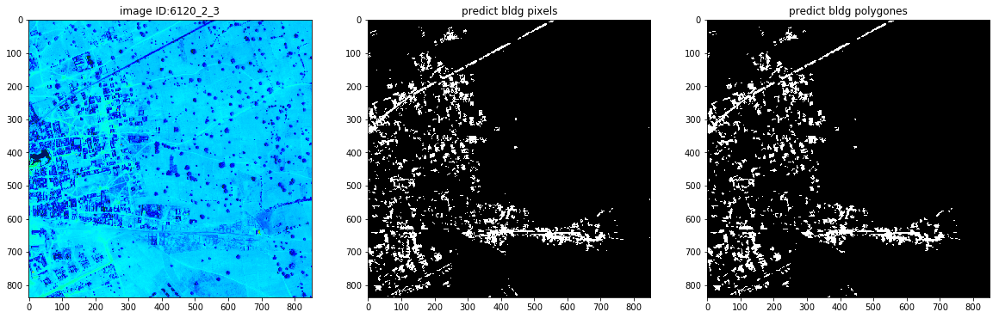

In [70]:
check_predict()

In [61]:
score, trs = calc_jacc(model)

((1075, 10, 160, 160), (1075, 10, 160, 160))
(0, 0.58854529664774857, 0.9)
(1, 0.58315941474079447, 0.9)
(2, 0.79052312149402304, 0.9)
(3, 0.29273376259861461, 0.9)
(4, 0.49062625475290417, 0.3)
(5, 0.53698802406125623, 0.3)
(6, 0.67691481542899568, 0.9)
(7, 0.90597489554048882, 0.9)
(8, 0.93722578008232071, 0.9)
(9, 0.93231958748615718, 0.9)


(0.67350109528333024, [0.9, 0.9, 0.9, 0.9, 0.3, 0.3, 0.9, 0.9, 0.9, 0.9])

In [ ]:
make_submit()

Self-intersection at or near point 333.25 830.75
Ring Self-intersection at or near point 669 800
Self-intersection at or near point 378 801
Ring Self-intersection at or near point 213 801
Ring Self-intersection at or near point 475 783
Self-intersection at or near point 425 778
Self-intersection at or near point 203.06451612903226 750.16129032258061
Self-intersection at or near point 237.75 736.375
Self-intersection at or near point 588 725
Self-intersection at or near point 380.39130434782606 722.52173913043475
Self-intersection at or near point 372 723
Self-intersection at or near point 229 705
Self-intersection at or near point 752 689
Self-intersection at or near point 310 689
Ring Self-intersection at or near point 493 687
Ring Self-intersection at or near point 28 686
Self-intersection at or near point 509.71428571428572 664.28571428571433
Ring Self-intersection at or near point 169 657
Self-intersection at or near point 604.14285714285711 670.28571428571433
Ring Self-intersectio

make submission file
    ImageId  ClassType                                    MultipolygonWKT
0  6120_2_4          1  POLYGON ((0 0, 0.009188 0, 0.009188 -0.0090399...
1  6120_2_4          2  POLYGON ((0 0, 0.009188 0, 0.009188 -0.0090399...
2  6120_2_4          3  POLYGON ((0 0, 0.009188 0, 0.009188 -0.0090399...
3  6120_2_4          4  POLYGON ((0 0, 0.009188 0, 0.009188 -0.0090399...
4  6120_2_4          5  POLYGON ((0 0, 0.009188 0, 0.009188 -0.0090399...


Self-intersection at or near point 239.78378378378378 101.45945945945945
Self-intersection at or near point 214 59
Ring Self-intersection at or near point 627 20
Self-intersection at or near point 429.88888888888891 833.22222222222217
Self-intersection at or near point 758 822
Self-intersection at or near point 330.19999999999999 832.60000000000002
Self-intersection at or near point 49.81818181818182 818.36363636363637
Ring Self-intersection at or near point 346 820
Ring Self-intersection at or near point 140 813
Self-intersection at or near point 789 802
Self-intersection at or near point 109.25 800.75
Ring Self-intersection at or near point 212 805
Ring Self-intersection at or near point 348 783
Self-intersection at or near point 87 783
Self-intersection at or near point 234.44444444444446 774.77777777777783
Self-intersection at or near point 244 760
Ring Self-intersection at or near point 83 760
Self-intersection at or near point 62.071428571428569 757.71428571428567
Self-intersecti

0


Ring Self-intersection at or near point 38 548
Self-intersection at or near point 113.20689655172414 550.31034482758616
Self-intersection at or near point 384.25 543.25
Self-intersection at or near point 464.84615384615387 546.46153846153845
Ring Self-intersection at or near point 675 544
Ring Self-intersection at or near point 625 528
Self-intersection at or near point 135.83333333333334 522.08333333333337
Self-intersection at or near point 527.66666666666663 523.66666666666663
Self-intersection at or near point 353 509
Ring Self-intersection at or near point 585 491
Self-intersection at or near point 376 486
Ring Self-intersection at or near point 417 493
Self-intersection at or near point 279.25 482.25
Self-intersection at or near point 94.200000000000003 475.39999999999998
Self-intersection at or near point 68 475
Self-intersection at or near point 194.47999999999999 452.68000000000001
Self-intersection at or near point 350.85714285714283 472.28571428571428
Self-intersection at or 

100


Ring Self-intersection at or near point 695 735
Self-intersection at or near point 824 745
Self-intersection at or near point 689 748
Self-intersection at or near point 208 745
Ring Self-intersection at or near point 608 731
Self-intersection at or near point 839.20000000000005 732
Ring Self-intersection at or near point 490 717
Ring Self-intersection at or near point 721 718
Self-intersection at or near point 793.84615384615381 745.30769230769226
Ring Self-intersection at or near point 728 723
Self-intersection at or near point 782 700
Ring Self-intersection at or near point 847 686
Self-intersection at or near point 763 694
Self-intersection at or near point 402 680
Self-intersection at or near point 705.5 704.5
Self-intersection at or near point 706 680
Self-intersection at or near point 806 682
Self-intersection at or near point 604 672
Ring Self-intersection at or near point 577 669
Ring Self-intersection at or near point 812 690
Self-intersection at or near point 109 683
Self-int

200


Ring Self-intersection at or near point 791 225
Self-intersection at or near point 718 204
Self-intersection at or near point 237.53846153846155 193.76923076923077
Self-intersection at or near point 580.625 191.375
Self-intersection at or near point 289.41666666666669 169.16666666666666
Self-intersection at or near point 202.17391304347825 164.13043478260869
Self-intersection at or near point 237.16 158.68000000000001
Self-intersection at or near point 656.83636363636367 158.78181818181818
Ring Self-intersection at or near point 698 146
Self-intersection at or near point 531.20000000000005 132.73333333333332
Self-intersection at or near point 646.11111111111109 121.66666666666667
Ring Self-intersection at or near point 701 98
Self-intersection at or near point 620 93
Self-intersection at or near point 739 80
Self-intersection at or near point 537 68
Self-intersection at or near point 657.83333333333337 49.083333333333336
Self-intersection at or near point 746 20
Self-intersection at or

300


Self-intersection at or near point 161 704
Ring Self-intersection at or near point 268 666
Ring Self-intersection at or near point 46 667
Self-intersection at or near point 373 687.85714285714289
Self-intersection at or near point 30 710
Self-intersection at or near point 367.36363636363637 666.4545454545455
Self-intersection at or near point 549.11111111111109 653.22222222222217
Self-intersection at or near point 254 651
Self-intersection at or near point 578.875 658.75
Self-intersection at or near point 396.28571428571428 705.71428571428567
Ring Self-intersection at or near point 86 653
Self-intersection at or near point 756.42857142857144 645.71428571428567
Self-intersection at or near point 66.200000000000003 643.60000000000002
Self-intersection at or near point 233.77777777777777 643.48148148148152
Self-intersection at or near point 208 671.33333333333337
Self-intersection at or near point 53 640
Self-intersection at or near point 467.33333333333331 806
Self-intersection at or nea

400


Self-intersection at or near point 704.23076923076928 824.92307692307691
Self-intersection at or near point 131 825
Ring Self-intersection at or near point 73 767
Ring Self-intersection at or near point 403 737
Ring Self-intersection at or near point 756 639
Self-intersection at or near point 544 834.25454545454545
Self-intersection at or near point 234 562
Self-intersection at or near point 623 620
Self-intersection at or near point 187.95652173913044 593.91304347826087
Ring Self-intersection at or near point 24 507
Self-intersection at or near point 643.375 503.5625
Ring Self-intersection at or near point 800 486
Self-intersection at or near point 7 480
Self-intersection at or near point 833 515
Ring Self-intersection at or near point 28 479
Ring Self-intersection at or near point 87 479
Ring Self-intersection at or near point 713 471
Self-intersection at or near point 2 450
Self-intersection at or near point 75.666666666666671 448.66666666666669
Ring Self-intersection at or near poi

500


Self-intersection at or near point 3 651.66666666666663
Self-intersection at or near point 401 638
Self-intersection at or near point 187.33333333333334 706.33333333333337
Self-intersection at or near point 152 628
Ring Self-intersection at or near point 177 622
Self-intersection at or near point 87.25 626.5
Self-intersection at or near point 136.81818181818181 602.969696969697
Self-intersection at or near point 68.07692307692308 626.84615384615381
Self-intersection at or near point 69.666666666666671 596.77777777777783
Self-intersection at or near point 597.16666666666663 593.08333333333337
Self-intersection at or near point 46 627
Ring Self-intersection at or near point 465 596
Self-intersection at or near point 73.5625 578.625
Self-intersection at or near point 352 566
Self-intersection at or near point 49.200000000000003 567.20000000000005
Self-intersection at or near point 40.523809523809526 564.28571428571433
Self-intersection at or near point 150 553
Self-intersection at or near

600


Self-intersection at or near point 259 486
Self-intersection at or near point 457.33333333333331 489
Self-intersection at or near point 316.88 483.60000000000002
Self-intersection at or near point 234 490.33333333333331
Self-intersection at or near point 734.5 479.5
Self-intersection at or near point 257 475
Self-intersection at or near point 454.60000000000002 468.60000000000002
Self-intersection at or near point 748.39999999999998 467.60000000000002
Self-intersection at or near point 80.090909090909093 471.54545454545456
Self-intersection at or near point 306 457
Self-intersection at or near point 590.91666666666663 442.58333333333331
Self-intersection at or near point 625.25 433.25
Self-intersection at or near point 485 430
Self-intersection at or near point 542.33333333333337 399.33333333333331
Ring Self-intersection at or near point 527 375
Self-intersection at or near point 491.05263157894734 375.15789473684208
Self-intersection at or near point 45.555555555555557 365.22222222222

700


Self-intersection at or near point 443 557
Ring Self-intersection at or near point 778 559
Self-intersection at or near point 80 555
Self-intersection at or near point 17 566
Self-intersection at or near point 796 566
Self-intersection at or near point 576.33333333333337 547.66666666666663
Self-intersection at or near point 594.61538461538464 545.84615384615381
Self-intersection at or near point 495.42857142857144 552.14285714285711
Self-intersection at or near point 597.29999999999995 552.60000000000002
Self-intersection at or near point 460.39999999999998 542.60000000000002
Ring Self-intersection at or near point 422 540
Self-intersection at or near point 321.19999999999999 540.60000000000002
Self-intersection at or near point 336.71428571428572 531.85714285714289
Self-intersection at or near point 808 528
Self-intersection at or near point 165.77777777777777 521.44444444444446
Self-intersection at or near point 154.93103448275863 521.68965517241384
Self-intersection at or near point

800


Self-intersection at or near point 210.17241379310346 743.89655172413791
Self-intersection at or near point 401.5 737.5
Ring Self-intersection at or near point 265 692
Self-intersection at or near point 390 691
Self-intersection at or near point 47 689
Self-intersection at or near point 362.46153846153845 675.69230769230774
Self-intersection at or near point 95.78947368421052 820.10526315789468
Self-intersection at or near point 225.77777777777777 693.14814814814815
Self-intersection at or near point 212.35294117647058 675.82352941176475
Self-intersection at or near point 61 671
Self-intersection at or near point 159 672
Self-intersection at or near point 216.81818181818181 667.36363636363637
Self-intersection at or near point 134 674
Self-intersection at or near point 255.14285714285714 667.28571428571433
Self-intersection at or near point 16.714285714285715 662.14285714285711
Self-intersection at or near point 41 663
Ring Self-intersection at or near point 158 685
Self-intersection a

900


Self-intersection at or near point 462.86666666666667 480.53333333333336
Self-intersection at or near point 341.11111111111109 478.77777777777777
Self-intersection at or near point 674.5454545454545 478.09090909090907
Ring Self-intersection at or near point 74 479
Self-intersection at or near point 12 464.60000000000002
Ring Self-intersection at or near point 121 461
Self-intersection at or near point 833 444
Self-intersection at or near point 673.875 447.125
Self-intersection at or near point 279 445
Self-intersection at or near point 773 424
Ring Self-intersection at or near point 627 427
Self-intersection at or near point 828.23529411764707 418.58823529411762
Ring Self-intersection at or near point 270 412
Self-intersection at or near point 4 403.5
Self-intersection at or near point 14 381
Self-intersection at or near point 134 369
Self-intersection at or near point 116 376
Self-intersection at or near point 552.71428571428567 359.07142857142856
Self-intersection at or near point 13

1000


Ring Self-intersection at or near point 306 706
Self-intersection at or near point 738.75 698
Self-intersection at or near point 239.09999999999999 698.70000000000005
Ring Self-intersection at or near point 178 706
Self-intersection at or near point 172.57142857142858 693.14285714285711
Self-intersection at or near point 393 687
Self-intersection at or near point 291 691
Self-intersection at or near point 188.25 674.6875
Ring Self-intersection at or near point 131 691
Self-intersection at or near point 373 698.55555555555554
Self-intersection at or near point 353 666
Self-intersection at or near point 811.33333333333337 682.33333333333337
Self-intersection at or near point 697.32558139534888 671.76744186046517
Self-intersection at or near point 396.41176470588238 655.52941176470586
Self-intersection at or near point 552 652
Self-intersection at or near point 564 671
Self-intersection at or near point 119.375 649.75
Self-intersection at or near point 145.5 663.9375
Self-intersection at 

1100


Ring Self-intersection at or near point 300 719
Ring Self-intersection at or near point 332 714
Self-intersection at or near point 552.30769230769226 714.84615384615381
Self-intersection at or near point 635.76923076923072 756.38461538461536
Ring Self-intersection at or near point 232 721
Self-intersection at or near point 483.16666666666669 756.11111111111109
Ring Self-intersection at or near point 287 711
Self-intersection at or near point 320.25 707
Self-intersection at or near point 302.71428571428572 708.42857142857144
Self-intersection at or near point 383.28571428571428 759.28571428571433
Self-intersection at or near point 507.66666666666669 701.66666666666663
Self-intersection at or near point 230.25 698.25
Self-intersection at or near point 79 694
Self-intersection at or near point 843.20000000000005 712.79999999999995
Self-intersection at or near point 181.59999999999999 704.60000000000002
Self-intersection at or near point 558.57142857142856 736.85714285714289
Self-intersect

1200


Self-intersection at or near point 638 438
Self-intersection at or near point 512 424
Ring Self-intersection at or near point 31 423
Self-intersection at or near point 624 413
Ring Self-intersection at or near point 58 420
Self-intersection at or near point 172.86666666666667 405.53333333333336
Self-intersection at or near point 745 401
Self-intersection at or near point 53.333333333333336 406
Self-intersection at or near point 814 396
Self-intersection at or near point 347.39130434782606 389.08695652173913
Ring Self-intersection at or near point 653 405
Self-intersection at or near point 546 386
Self-intersection at or near point 604 385
Self-intersection at or near point 365.75 383.75
Self-intersection at or near point 116.81818181818181 381.90909090909093
Self-intersection at or near point 121 375
Self-intersection at or near point 92.5 368.5
Self-intersection at or near point 253.5 360.5
Ring Self-intersection at or near point 576 349
Self-intersection at or near point 633 347
Self

1300


Ring Self-intersection at or near point 186 439
Self-intersection at or near point 688.66666666666663 400
Self-intersection at or near point 617 388.5
Self-intersection at or near point 228 385
Self-intersection at or near point 283 380
Self-intersection at or near point 688 374
Self-intersection at or near point 323 367
Self-intersection at or near point 197 354
Self-intersection at or near point 397.26666666666665 338.86666666666667
Self-intersection at or near point 766 348
Self-intersection at or near point 752 317
Self-intersection at or near point 100.23076923076923 321.15384615384613
Ring Self-intersection at or near point 822 303
Self-intersection at or near point 380.77777777777777 295.55555555555554
Self-intersection at or near point 187 292.5
Self-intersection at or near point 707.63636363636363 279.45454545454544
Self-intersection at or near point 331 269
Self-intersection at or near point 666 256.66666666666669
Ring Self-intersection at or near point 19 242
Self-intersecti

1400


Self-intersection at or near point 349 385
Self-intersection at or near point 186.80000000000001 369.60000000000002
Self-intersection at or near point 41.06666666666667 373.19999999999999
Self-intersection at or near point 553.33333333333337 370.33333333333331
Ring Self-intersection at or near point 522 380
Self-intersection at or near point 687 364
Self-intersection at or near point 352.19999999999999 362.19999999999999
Ring Self-intersection at or near point 534 364
Self-intersection at or near point 753 365
Self-intersection at or near point 458.88888888888891 356.33333333333331
Self-intersection at or near point 379.5 353.5
Self-intersection at or near point 519 351.28571428571428
Self-intersection at or near point 822.0625 362.0625
Self-intersection at or near point 780.77777777777783 364.77777777777777
Self-intersection at or near point 585.18181818181813 331.36363636363637
Ring Self-intersection at or near point 575 339
Self-intersection at or near point 538.60000000000002 330.1

1500


Self-intersection at or near point 697.15384615384619 281.07692307692309
Self-intersection at or near point 798 241
Self-intersection at or near point 741.66666666666663 228.5
Self-intersection at or near point 739.30303030303025 194.12121212121212
Ring Self-intersection at or near point 820 115
Self-intersection at or near point 700 117
Self-intersection at or near point 295 91
Self-intersection at or near point 62 50
Self-intersection at or near point 31.666666666666668 50.333333333333336
Ring Self-intersection at or near point 4 70
Self-intersection at or near point 666 50
Ring Self-intersection at or near point 676 41
Self-intersection at or near point 314.39999999999998 33.799999999999997
Self-intersection at or near point 343.79411764705884 34.941176470588232
Ring Self-intersection at or near point 471 21
Self-intersection at or near point 629 20.428571428571427
Self-intersection at or near point 332.35294117647061 27.882352941176471
Self-intersection at or near point 640 587
Sel

1600


Self-intersection at or near point 457 520
Ring Self-intersection at or near point 103 362
Ring Self-intersection at or near point 212 812
Self-intersection at or near point 388 801
Self-intersection at or near point 129.125 827.75
Self-intersection at or near point 67 801
Self-intersection at or near point 770.86666666666667 785.5333333333333
Self-intersection at or near point 272.57142857142856 821.42857142857144
Self-intersection at or near point 1 773
Ring Self-intersection at or near point 480 733
Ring Self-intersection at or near point 223 699
Self-intersection at or near point 368 684
Self-intersection at or near point 98 626.5
Self-intersection at or near point 160 610
Ring Self-intersection at or near point 578 639
Self-intersection at or near point 462 593
Ring Self-intersection at or near point 405 586
Self-intersection at or near point 833 598.5
Self-intersection at or near point 534.53846153846155 542.76923076923072
Ring Self-intersection at or near point 48 508
Self-inter

1700


Self-intersection at or near point 171 456
Self-intersection at or near point 480.44444444444446 453.77777777777777
Self-intersection at or near point 594 465
Ring Self-intersection at or near point 370 437
Ring Self-intersection at or near point 239 437
Ring Self-intersection at or near point 834 422
Self-intersection at or near point 152.52631578947367 423.15789473684208
Self-intersection at or near point 469 426
Self-intersection at or near point 795.13043478260875 427.17391304347825
Interior is disconnected at or near point 291 426
Ring Self-intersection at or near point 468 406
Self-intersection at or near point 640.55555555555554 404.77777777777777
Self-intersection at or near point 127.41176470588235 402.44117647058823
Self-intersection at or near point 739.42105263157896 403.31578947368422
Self-intersection at or near point 282.91304347826087 417.3478260869565
Self-intersection at or near point 566.66666666666663 443.66666666666669
Ring Self-intersection at or near point 379 39

1800


Self-intersection at or near point 752.07692307692309 540.38461538461536
Self-intersection at or near point 694.0526315789474 107.89473684210526
Self-intersection at or near point 658.57142857142856 398
Self-intersection at or near point 833 465
Ring Self-intersection at or near point 792 464
Ring Self-intersection at or near point 768 457
Ring Self-intersection at or near point 405 374
Self-intersection at or near point 437.33333333333331 326
Self-intersection at or near point 338 289
Ring Self-intersection at or near point 714 279
Self-intersection at or near point 58.19047619047619 133.33333333333334
Self-intersection at or near point 133.92857142857142 207.85714285714286
Self-intersection at or near point 193 312
Self-intersection at or near point 487.05405405405406 305.2162162162162
Self-intersection at or near point 811.11111111111109 178.22222222222223
Ring Self-intersection at or near point 426 169
Self-intersection at or near point 496.85714285714283 150.57142857142858
Self-in

1900


Self-intersection at or near point 637.18181818181813 384.81818181818181
Self-intersection at or near point 699.5454545454545 378.72727272727275
Self-intersection at or near point 327 375
Self-intersection at or near point 336.8857142857143 373.54285714285714
Self-intersection at or near point 760.07692307692309 372.76923076923077
Self-intersection at or near point 432 369
Self-intersection at or near point 462.19999999999999 360.19999999999999
Self-intersection at or near point 763 358
Self-intersection at or near point 842.16666666666663 354.58333333333331
Self-intersection at or near point 792 352.33333333333331
Self-intersection at or near point 371.39999999999998 333.80000000000001
Self-intersection at or near point 374 331
Self-intersection at or near point 323.90909090909093 333.09090909090907
Self-intersection at or near point 272.5 331
Self-intersection at or near point 94 320
Self-intersection at or near point 755.5 319
Self-intersection at or near point 727.71428571428567 31

2000


Self-intersection at or near point 594.66666666666663 491.5
Ring Self-intersection at or near point 629 454
Self-intersection at or near point 820.875 452.5
Ring Self-intersection at or near point 513 451
Ring Self-intersection at or near point 700 433
Self-intersection at or near point 793.31578947368416 428.21052631578948
Ring Self-intersection at or near point 700 417
Self-intersection at or near point 590.76923076923072 403.15384615384613
Self-intersection at or near point 692.125 392.25
Self-intersection at or near point 557.96000000000004 384.27999999999997
Self-intersection at or near point 821 376
Self-intersection at or near point 658.66666666666663 374.66666666666669
Self-intersection at or near point 605.71428571428567 373.14285714285717
Self-intersection at or near point 577.875 349.875
Self-intersection at or near point 5.7857142857142856 338.35714285714283
Self-intersection at or near point 699 332.25
Self-intersection at or near point 682 331
Ring Self-intersection at or

2100


Ring Self-intersection at or near point 17 720
Self-intersection at or near point 174.54545454545453 625.5454545454545
Self-intersection at or near point 200 306.5
Self-intersection at or near point 119 256.5
Self-intersection at or near point 670 229
Ring Self-intersection at or near point 286 181
Self-intersection at or near point 695.25 167.5
Self-intersection at or near point 32.25 219.75
Self-intersection at or near point 830 123
Self-intersection at or near point 160 83
Self-intersection at or near point 177 50
Self-intersection at or near point 805 63
Self-intersection at or near point 37.454545454545453 91.818181818181813
Ring Self-intersection at or near point 293 832
Self-intersection at or near point 148.66666666666666 830
Self-intersection at or near point 608.39393939393938 827.15151515151513
Ring Self-intersection at or near point 421 830
Self-intersection at or near point 729 825
Ring Self-intersection at or near point 373 820
Ring Self-intersection at or near point 775 

2200


Self-intersection at or near point 168.59999999999999 684.39999999999998
Ring Self-intersection at or near point 781 684
Self-intersection at or near point 491.18518518518516 693.92592592592598
Self-intersection at or near point 357.60000000000002 683.20000000000005
Ring Self-intersection at or near point 771 678
Self-intersection at or near point 421 672
Ring Self-intersection at or near point 497 671
Self-intersection at or near point 830.25 675.25
Ring Self-intersection at or near point 169 666
Ring Self-intersection at or near point 152 668
Self-intersection at or near point 830.73333333333335 662.13333333333333
Self-intersection at or near point 535 658
Ring Self-intersection at or near point 505 663
Ring Self-intersection at or near point 479 650
Ring Self-intersection at or near point 582 653
Self-intersection at or near point 764.20000000000005 648.20000000000005
Ring Self-intersection at or near point 800 646
Self-intersection at or near point 377.14285714285717 645.4285714285

2300


Self-intersection at or near point 827.14285714285711 511.14285714285717
Self-intersection at or near point 160 125
Self-intersection at or near point 642.30769230769226 830.15384615384619
Self-intersection at or near point 157.42857142857142 813.28571428571433
Ring Self-intersection at or near point 524 810
Self-intersection at or near point 573.29999999999995 792.54999999999995
Self-intersection at or near point 566 772
Self-intersection at or near point 717.08333333333337 767.16666666666663
Self-intersection at or near point 661.20000000000005 767.10000000000002
Ring Self-intersection at or near point 524 737
Self-intersection at or near point 347.9375 730.75
Self-intersection at or near point 163.70588235294119 730.17647058823525
Ring Self-intersection at or near point 232 793
Self-intersection at or near point 818.39999999999998 731.79999999999995
Ring Self-intersection at or near point 136 719
Self-intersection at or near point 671.07692307692309 689.69230769230774
Self-intersect

2400


Self-intersection at or near point 322.09090909090907 824.5454545454545
Ring Self-intersection at or near point 9 802
Self-intersection at or near point 92.400000000000006 762
Self-intersection at or near point 651.56521739130437 737.17391304347825
Self-intersection at or near point 10 432
Self-intersection at or near point 484.80000000000001 273.80000000000001
Ring Self-intersection at or near point 442 246
Self-intersection at or near point 417 235
Ring Self-intersection at or near point 88 85
Ring Self-intersection at or near point 164 815
Ring Self-intersection at or near point 125 773
Ring Self-intersection at or near point 483 744
Ring Self-intersection at or near point 400 748
Self-intersection at or near point 220 732
Ring Self-intersection at or near point 502 731
Ring Self-intersection at or near point 118 716
Self-intersection at or near point 584 678
Ring Self-intersection at or near point 389 682
Self-intersection at or near point 779 680
Self-intersection at or near point

2500


Self-intersection at or near point 321 737.5
Ring Self-intersection at or near point 207 730
Self-intersection at or near point 116 735
Ring Self-intersection at or near point 67 739
Self-intersection at or near point 676.47058823529414 729.17647058823525
Self-intersection at or near point 514 733
Self-intersection at or near point 480 728
Self-intersection at or near point 382 724
Self-intersection at or near point 217.44999999999999 725.39999999999998
Self-intersection at or near point 416 733
Self-intersection at or near point 373 716
Self-intersection at or near point 534.60000000000002 709
Self-intersection at or near point 808.4545454545455 705.63636363636363
Self-intersection at or near point 203.5 699.5
Self-intersection at or near point 221 692
Self-intersection at or near point 679 694
Self-intersection at or near point 367 682.5
Self-intersection at or near point 588.33333333333337 681.33333333333337
Self-intersection at or near point 226 672
Ring Self-intersection at or nea

2600


Self-intersection at or near point 403.88461538461536 230.92307692307693
Self-intersection at or near point 327 222
Self-intersection at or near point 553.29411764705878 215.94117647058823
Self-intersection at or near point 523.42857142857144 215.42857142857142
Self-intersection at or near point 111.28571428571429 213.78571428571428
Self-intersection at or near point 513 210.25
Self-intersection at or near point 735 202
Ring Self-intersection at or near point 488 195
Self-intersection at or near point 447.08333333333331 193.0625
Self-intersection at or near point 409.94285714285712 188.22857142857143
Self-intersection at or near point 239 183
Ring Self-intersection at or near point 288 167
Self-intersection at or near point 18 140.88888888888889
Ring Self-intersection at or near point 378 133
Self-intersection at or near point 40 130
Self-intersection at or near point 277 131
Ring Self-intersection at or near point 468 122
Self-intersection at or near point 443.73333333333335 126.06666

2700


Self-intersection at or near point 537.11111111111109 292.83333333333331
Self-intersection at or near point 456 283
Self-intersection at or near point 375 268
Self-intersection at or near point 511.39999999999998 265
Self-intersection at or near point 847 242
Self-intersection at or near point 625.22580645161293 236.32258064516128
Ring Self-intersection at or near point 667 232
Self-intersection at or near point 215 225.5
Self-intersection at or near point 22.5 234.25
Self-intersection at or near point 264.1875 219.4375
Self-intersection at or near point 11.357142857142858 206.42857142857142
Self-intersection at or near point 440 189
Self-intersection at or near point 243.54545454545453 181.18181818181819
Self-intersection at or near point 843.60000000000002 161
Ring Self-intersection at or near point 247 137
Self-intersection at or near point 59.857142857142854 130.71428571428572
Ring Self-intersection at or near point 357 122
Self-intersection at or near point 204.41666666666666 114.

2800


Self-intersection at or near point 378 765
Ring Self-intersection at or near point 147 732
Ring Self-intersection at or near point 86 732
Self-intersection at or near point 317.92307692307691 723.15384615384619
Ring Self-intersection at or near point 367 730
Ring Self-intersection at or near point 165 731
Self-intersection at or near point 730 719
Self-intersection at or near point 132.08333333333334 717.16666666666663
Self-intersection at or near point 352.63636363636363 724.90909090909088
Self-intersection at or near point 261.125 727.75
Self-intersection at or near point 444.19999999999999 714.60000000000002
Self-intersection at or near point 470 706
Self-intersection at or near point 691 709
Self-intersection at or near point 406.35294117647061 719.88235294117646
Self-intersection at or near point 516.39999999999998 700
Self-intersection at or near point 795 704.66666666666663
Self-intersection at or near point 711 688
Self-intersection at or near point 541 688
Self-intersection at

2900


Self-intersection at or near point 518 648
Self-intersection at or near point 346 660
Self-intersection at or near point 741 640
Self-intersection at or near point 617.48275862068965 645.27586206896547
Self-intersection at or near point 688.07407407407402 636.14814814814815
Ring Self-intersection at or near point 496 636
Self-intersection at or near point 188.71428571428572 627.57142857142856
Ring Self-intersection at or near point 322 630
Self-intersection at or near point 236.59999999999999 624.39999999999998
Self-intersection at or near point 361 623
Self-intersection at or near point 498 614
Interior is disconnected at or near point 665 610
Interior is disconnected at or near point 472 610
Self-intersection at or near point 686 598
Ring Self-intersection at or near point 560 598
Ring Self-intersection at or near point 598 596
Self-intersection at or near point 819 583
Self-intersection at or near point 119 584
Self-intersection at or near point 687 571
Ring Self-intersection at or 

3000


Self-intersection at or near point 126 244
Self-intersection at or near point 403.19999999999999 236
Self-intersection at or near point 466.19999999999999 232.40000000000001
Self-intersection at or near point 114.71428571428571 227.85714285714286
Ring Self-intersection at or near point 191 225
Self-intersection at or near point 478.53125 228.625
Ring Self-intersection at or near point 85 237
Self-intersection at or near point 446 226
Ring Self-intersection at or near point 484 210
Self-intersection at or near point 406 206
Self-intersection at or near point 361.07999999999998 217.52000000000001
Ring Self-intersection at or near point 367 196
Self-intersection at or near point 307.14285714285717 190.14285714285714
Self-intersection at or near point 267 191
Self-intersection at or near point 364.36363636363637 190
Self-intersection at or near point 314.39999999999998 221
Self-intersection at or near point 104 185
Self-intersection at or near point 292.45454545454544 181.54545454545453
Se

3100


Self-intersection at or near point 803.5333333333333 426.33333333333331
Self-intersection at or near point 488.375 413.25
Self-intersection at or near point 608 411.125
Ring Self-intersection at or near point 816 410
Self-intersection at or near point 673 371
Self-intersection at or near point 159 366
Self-intersection at or near point 732.14285714285711 303.71428571428572
Self-intersection at or near point 219 301.5
Self-intersection at or near point 548.4545454545455 292.27272727272725
Self-intersection at or near point 211 279
Ring Self-intersection at or near point 676 264
Self-intersection at or near point 512.60784313725492 233.47058823529412
Ring Self-intersection at or near point 17 219
Ring Self-intersection at or near point 651 212
Self-intersection at or near point 32.833333333333336 198.08333333333334
Ring Self-intersection at or near point 58 193
Self-intersection at or near point 51.5 182.5
Ring Self-intersection at or near point 3 178
Self-intersection at or near point 4

3200


Self-intersection at or near point 81.099999999999994 573.64999999999998
Ring Self-intersection at or near point 45 559
Ring Self-intersection at or near point 115 64
Self-intersection at or near point 91.181818181818187 37.272727272727273
Self-intersection at or near point 370.39999999999998 720.39999999999998
Self-intersection at or near point 145 724
Self-intersection at or near point 320 689
Self-intersection at or near point 73.111111111111114 504.88888888888891
Ring Self-intersection at or near point 50 414
Self-intersection at or near point 2 320
Self-intersection at or near point 62 55
Self-intersection at or near point 86.5 25
Self-intersection at or near point 208.09090909090909 34.909090909090907
Self-intersection at or near point 1.5619834710743801 649.14049586776855
Self-intersection at or near point 832.33333333333337 756
Self-intersection at or near point 355 717
Ring Self-intersection at or near point 293 702
Ring Self-intersection at or near point 56 590
Self-intersect

3300


Self-intersection at or near point 774.46153846153845 49.07692307692308
Self-intersection at or near point 800 826
Ring Self-intersection at or near point 468 744
Ring Self-intersection at or near point 740 730
Self-intersection at or near point 617 734
Self-intersection at or near point 47.547169811320757 637.43396226415098
Self-intersection at or near point 440 628
Ring Self-intersection at or near point 146 641
Self-intersection at or near point 602 606
Self-intersection at or near point 181.14285714285714 521.78571428571433
Self-intersection at or near point 159 447
Self-intersection at or near point 159 424
Self-intersection at or near point 305 446
Self-intersection at or near point 689.42857142857144 421.28571428571428
Self-intersection at or near point 742 402
Self-intersection at or near point 799 380
Ring Self-intersection at or near point 640 374
Self-intersection at or near point 98 328.5
Self-intersection at or near point 651.42857142857144 322.42857142857144
Self-intersec

3400


Self-intersection at or near point 527 602
Ring Self-intersection at or near point 26 613
Ring Self-intersection at or near point 675 604
Self-intersection at or near point 62.714285714285715 587
Self-intersection at or near point 637.39999999999998 582
Self-intersection at or near point 646 584
Self-intersection at or near point 596.25 584.25
Self-intersection at or near point 106 576
Ring Self-intersection at or near point 469 589
Ring Self-intersection at or near point 70 568
Self-intersection at or near point 1.7142857142857142 567.71428571428567
Self-intersection at or near point 795.625 559.5625
Ring Self-intersection at or near point 780 563
Self-intersection at or near point 705.53846153846155 562.07692307692309
Self-intersection at or near point 632 539
Self-intersection at or near point 413 527
Self-intersection at or near point 101.8 515.39999999999998
Self-intersection at or near point 475 511.66666666666669
Self-intersection at or near point 448.5 536
Ring Self-intersectio

3500


Ring Self-intersection at or near point 425 175
Self-intersection at or near point 265.18181818181819 128.63636363636363
Self-intersection at or near point 186.30769230769232 116.84615384615384
Self-intersection at or near point 238 108
Self-intersection at or near point 564.22222222222217 97.592592592592595
Self-intersection at or near point 345 61
Self-intersection at or near point 267 57.333333333333336
Self-intersection at or near point 288.11111111111109 47.222222222222221
Ring Self-intersection at or near point 309 44
Self-intersection at or near point 380 23
Self-intersection at or near point 582 833
Self-intersection at or near point 22.399999999999999 760.20000000000005
Self-intersection at or near point 421 657
Ring Self-intersection at or near point 146 665
Self-intersection at or near point 489 641
Self-intersection at or near point 217 648.25
Self-intersection at or near point 641 738
Self-intersection at or near point 590 641
Self-intersection at or near point 617 544
Sel

3600


Self-intersection at or near point 821.76923076923072 650
Ring Self-intersection at or near point 502 639
Self-intersection at or near point 836.20000000000005 629.79999999999995
Ring Self-intersection at or near point 86 625
Self-intersection at or near point 615.15384615384619 624.15384615384619
Self-intersection at or near point 791 624
Self-intersection at or near point 405 618
Self-intersection at or near point 629 620
Self-intersection at or near point 576.625 613.625
Self-intersection at or near point 229.57142857142858 613.71428571428567
Ring Self-intersection at or near point 725 610
Ring Self-intersection at or near point 317 610
Ring Self-intersection at or near point 795 600
Self-intersection at or near point 543 618
Ring Self-intersection at or near point 54 595
Self-intersection at or near point 329 582
Self-intersection at or near point 822.09090909090912 583.09090909090912
Ring Self-intersection at or near point 127 563
Ring Self-intersection at or near point 789 554
Se

3700


Self-intersection at or near point 835 390
Self-intersection at or near point 655 392
Self-intersection at or near point 659 383
Self-intersection at or near point 805 384
Ring Self-intersection at or near point 643 389
Self-intersection at or near point 807.60000000000002 365.39999999999998
Self-intersection at or near point 625 364
Ring Self-intersection at or near point 707 354
Self-intersection at or near point 664 340
Self-intersection at or near point 314 332
Self-intersection at or near point 311 280
Ring Self-intersection at or near point 830 283
Ring Self-intersection at or near point 777 241
Self-intersection at or near point 1.2 234
Self-intersection at or near point 827.18181818181813 229.63636363636363
Self-intersection at or near point 495.16666666666669 239.33333333333334
Self-intersection at or near point 238 220
Self-intersection at or near point 544 223
Ring Self-intersection at or near point 510 215
Ring Self-intersection at or near point 762 218
Ring Self-intersecti

3800


Ring Self-intersection at or near point 562 722
Ring Self-intersection at or near point 464 731
Ring Self-intersection at or near point 571 729
Self-intersection at or near point 670.20000000000005 733.60000000000002
Self-intersection at or near point 726 710
Self-intersection at or near point 706.5 706.5
Self-intersection at or near point 517 699
Ring Self-intersection at or near point 378 708
Self-intersection at or near point 532 693
Self-intersection at or near point 684.63636363636363 692.81818181818187
Self-intersection at or near point 390 681
Self-intersection at or near point 826 678
Ring Self-intersection at or near point 176 684
Self-intersection at or near point 237.18181818181819 679.09090909090912
Self-intersection at or near point 581 679
Self-intersection at or near point 508.39999999999998 664.39999999999998
Ring Self-intersection at or near point 247 666
Self-intersection at or near point 419.0625 664.75
Self-intersection at or near point 618.27272727272725 664.363636

3900


Self-intersection at or near point 673 493
Self-intersection at or near point 290.33333333333331 482
Ring Self-intersection at or near point 701 480
Self-intersection at or near point 260.88235294117646 482.8235294117647
Self-intersection at or near point 254 481
Self-intersection at or near point 821 473
Self-intersection at or near point 526.66666666666663 474.66666666666669
Self-intersection at or near point 490 473
Self-intersection at or near point 744.28571428571433 476.71428571428572
Self-intersection at or near point 594 477
Self-intersection at or near point 671.68421052631584 458.10526315789474
Self-intersection at or near point 89 452
Self-intersection at or near point 61.5 455
Self-intersection at or near point 744.18181818181813 458.18181818181819
Self-intersection at or near point 630.12280701754389 449.03508771929825
Self-intersection at or near point 664.48275862068965 448.65517241379308
Self-intersection at or near point 595.39999999999998 406.80000000000001
Self-inter

4000


Self-intersection at or near point 436 43
Self-intersection at or near point 253 45
Self-intersection at or near point 183 47
Self-intersection at or near point 400 28
Self-intersection at or near point 34 23
Self-intersection at or near point 381 28
Self-intersection at or near point 358 16
Self-intersection at or near point 391.71428571428572 10.714285714285714
Self-intersection at or near point 774.57894736842104 821.0526315789474
Ring Self-intersection at or near point 319 707
Self-intersection at or near point 806 673.33333333333337
Ring Self-intersection at or near point 640 668
Self-intersection at or near point 711.73333333333335 687.86666666666667
Self-intersection at or near point 439 655
Self-intersection at or near point 483.38095238095241 736.19047619047615
Ring Self-intersection at or near point 171 618
Self-intersection at or near point 741 627
Self-intersection at or near point 474 534
Ring Self-intersection at or near point 751 530
Self-intersection at or near point 31

4100


Ring Self-intersection at or near point 151 617
Ring Self-intersection at or near point 720 616
Ring Self-intersection at or near point 38 623
Ring Self-intersection at or near point 332 612
Self-intersection at or near point 406.19999999999999 610
Self-intersection at or near point 703.11764705882354 607.47058823529414
Self-intersection at or near point 594 606
Ring Self-intersection at or near point 453 618
Self-intersection at or near point 444 595
Self-intersection at or near point 544.07692307692309 591.38461538461536
Ring Self-intersection at or near point 183 583
Self-intersection at or near point 86 587
Self-intersection at or near point 734.76470588235293 573.94117647058829
Self-intersection at or near point 156 559
Ring Self-intersection at or near point 227 560
Self-intersection at or near point 39.333333333333336 548.83333333333337
Self-intersection at or near point 321.83333333333331 543.375
Self-intersection at or near point 144.125 539.25
Self-intersection at or near poi

4200


Self-intersection at or near point 158 318
Ring Self-intersection at or near point 681 308
Self-intersection at or near point 524 302
Self-intersection at or near point 796.39999999999998 318.19999999999999
Self-intersection at or near point 758 298
Self-intersection at or near point 562 297
Ring Self-intersection at or near point 687 283
Self-intersection at or near point 590.25 288.25
Self-intersection at or near point 801.71428571428567 238.14285714285714
Self-intersection at or near point 803 226.5
Ring Self-intersection at or near point 26 235
Ring Self-intersection at or near point 470 207
Ring Self-intersection at or near point 820 221
Ring Self-intersection at or near point 738 182
Self-intersection at or near point 773.20588235294122 177.02941176470588
Self-intersection at or near point 787.09090909090912 172.63636363636363
Self-intersection at or near point 660.25 160.5
Self-intersection at or near point 767 168
Ring Self-intersection at or near point 805 159
Self-intersectio